In [1]:
# Initial imports
import pandas as pd
import alpaca_trade_api as tradeapi
from finta import TA
import numpy as np


In [2]:
# API credentials
ALPACA_API_KEY = 'PKETI0Q5C8PPUXVNHJFJ'
ALPACA_SECRET_KEY = 'WQxmEpBCoMXydCCg0G8cUe6hGLpgaAfrvedZ09Fy'
ALPACA_API_BASE_URL = "https://paper-api.alpaca.markets"

# Create a connection to the API 
api = tradeapi.REST(ALPACA_API_KEY, ALPACA_SECRET_KEY, ALPACA_API_BASE_URL, api_version="v2")

# Set signal variable
signal = 1

# Create buy signal, num shares and ticker
if signal == 1:
    orderSide = "buy"
else:
    orderSide = "sell"
    
# Set the ticket symbol and the number of shares to buy
ticker = "META"
number_of_shares = 1

# Make API call
prices = api.get_bars(ticker, "5Min", "2022-08-22", "2022-10-14", adjustment='raw').df
# Reorganize the DataFrame
prices = pd.concat([prices], axis=1, keys=["TSLA"])

# Drop the Multi-Index from the DataFrame
prices.columns = prices.columns.droplevel(0)
# create a seperate dataframe for signals
signals_df = prices
signals_df

,open,high,low,close,volume,trade_count,vwap
timestamp,,,,,,,
2022-08-22 05:05:00+00:00,167.00,167.00,167.00,167.00,150,1,167.000000
2022-08-22 08:00:00+00:00,166.67,166.67,165.30,165.30,5352,192,165.939097
2022-08-22 08:05:00+00:00,165.52,165.90,165.44,165.76,2384,57,165.609534
2022-08-22 08:10:00+00:00,165.64,165.64,165.33,165.33,3416,102,165.479877
2022-08-22 08:15:00+00:00,165.30,165.30,165.30,165.30,472,21,165.274470
...,...,...,...,...,...,...,...
2022-10-14 23:30:00+00:00,126.26,126.26,126.26,126.26,251,8,126.271633
2022-10-14 23:40:00+00:00,126.22,126.22,126.22,126.22,448,17,126.195536
2022-10-14 23:45:00+00:00,126.15,126.15,126.11,126.11,691,29,126.133487


In [3]:
#  Setup EMAs for crosses
signals_df["9EMA"] = TA.EMA(signals_df, 9)
signals_df["20EMA"] = TA.EMA(signals_df, 20)
signals_df["50EMA"] = TA.EMA(signals_df, 50)
signals_df["200SMA"] = TA.SMA(signals_df, 200)

# Setup Indicators
signals_df["ATR"] = TA.ATR(signals_df)
bbands_df = TA.BBANDS(signals_df)
macd_df = TA.MACD(signals_df)
signals_df["RSI"] = TA.RSI(signals_df)

# join macd and bbands Dataframes to signals_df
bbands_df = pd.concat([bbands_df, macd_df], axis=1)
signals_df = pd.concat([signals_df, bbands_df], axis=1)
signals_df.drop(columns=["SIGNAL", "BB_MIDDLE"], inplace=True)
signals_df

# Review DataFrame
signals_df

,open,high,low,close,volume,trade_count,vwap,9EMA,20EMA,50EMA,200SMA,ATR,RSI,BB_UPPER,BB_LOWER,MACD
timestamp,,,,,,,,,,,,,,,,
2022-08-22 05:05:00+00:00,167.00,167.00,167.00,167.00,150,1,167.000000,167.000000,167.000000,167.000000,NaN,NaN,NaN,NaN,NaN,0.000000
2022-08-22 08:00:00+00:00,166.67,166.67,165.30,165.30,5352,192,165.939097,166.055556,166.107500,166.133000,NaN,NaN,0.000000,NaN,NaN,-0.038141
2022-08-22 08:05:00+00:00,165.52,165.90,165.44,165.76,2384,57,165.609534,165.934426,165.979900,166.003661,NaN,NaN,22.564821,NaN,NaN,-0.034335
2022-08-22 08:10:00+00:00,165.64,165.64,165.33,165.33,3416,102,165.479877,165.729675,165.792284,165.825009,NaN,NaN,18.387876,NaN,NaN,-0.047287
2022-08-22 08:15:00+00:00,165.30,165.30,165.30,165.30,472,21,165.274470,165.601856,165.673205,165.711442,NaN,NaN,18.135646,NaN,NaN,-0.054523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-14 23:30:00+00:00,126.26,126.26,126.26,126.26,251,8,126.271633,126.337310,126.440169,126.826990,128.760020,0.104286,39.335695,126.654313,126.192687,-0.147604
2022-10-14 23:40:00+00:00,126.22,126.22,126.22,126.22,448,17,126.195536,126.313848,126.419200,126.803186,128.739670,0.102143,38.095671,126.654318,126.164682,-0.148015
2022-10-14 23:45:00+00:00,126.15,126.15,126.11,126.11,691,29,126.133487,126.273078,126.389753,126.776002,128.720170,0.108571,34.842753,126.674134,126.115866,-0.155425


In [4]:
# here we create the exit column, our "y", for use in supervised ML
# How many rows are in the signals_df? for use in modifying DataFrame
periods = signals_df.shape[0]
# Exit is the labeled target for ML, Exit Price is for use in Pnl Metrics
signals_df["Exit"] = 0
signals_df["Exit Price"] = 0

# Exit is the labeled target for ML, Exit Price is for use in Pnl Metrics
signals_df["Exit"] = 0
signals_df["Exit Price"] = 0

# we also figure out our exit price
# target price signaling a win will be 1
# stop price signaling a loss will be -1
# loop thru the dataframe, from row 200 to the end (periods)
for j in range(200, periods):
    # entries will be on candle close
    entry = signals_df["close"].iloc[j]
    # calculate volatility for each candle
    atr = signals_df["ATR"].iloc[j]
    # stop is entry price minus the average volatility for the entry period
    stop = entry + (atr * 3)
    # target is entry price plus the average volatility for the entry period times a multiplier
    target = entry - (atr)
    # loop again thru the dataset to compare j entry price to future closing prices to see if we hit target or stop
    for k in range(j + 1, periods):
        # current low of the candle
        curr_low = signals_df["low"].iloc[k]
        # current high of the candle
        curr_high = signals_df["high"].iloc[k]
        # record and break if we hit stop or target, if not we check the next k period
        # if current low breaks our stop we should've sold: -1 in our "Exit" column
        if curr_low <= target:
            signals_df["Exit Price"].iloc[j] = target
            signals_df["Exit"].iloc[j] = 1
            # if we hit the stop break the inner loop to check the next row
            break
        # if current high breaks our target we should've sold: +1 in our "Exit" column
        elif curr_high >= stop:
            signals_df["Exit Price"].iloc[j] = stop
            signals_df["Exit"].iloc[j] = -1
            # if we hit the target break the inner loop to check the next row
            break

# drop beginning columns to avoid NaN values from EMA/SMA calculations
signals_df = signals_df[200:]

signals_df

C:\Users\range\anaconda3\envs\dev\envs\dev\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,open,high,low,close,volume,trade_count,vwap,9EMA,20EMA,50EMA,200SMA,ATR,RSI,BB_UPPER,BB_LOWER,MACD,Exit,Exit Price
timestamp,,,,,,,,,,,,,,,,,,
2022-08-23 11:05:00+00:00,163.4000,163.6300,163.4000,163.50,8956,132,163.484913,163.594221,163.618230,163.508711,163.896505,0.222143,47.674332,164.096861,163.298139,0.008344,1,163.277857
2022-08-23 11:10:00+00:00,163.3300,163.5100,163.3300,163.51,767,36,163.371030,163.577377,163.607923,163.508762,163.887555,0.230000,47.919533,164.098661,163.284339,-0.000308,1,163.280000
2022-08-23 11:15:00+00:00,163.5000,163.5100,163.5000,163.51,334,17,163.506332,163.563902,163.598597,163.508811,163.876305,0.215714,47.919533,164.100361,163.273639,-0.007084,1,163.294286
2022-08-23 11:20:00+00:00,163.4201,163.5905,163.4201,163.58,813,24,163.519994,163.567121,163.596826,163.511603,163.867555,0.214314,49.828217,164.099001,163.266999,-0.006727,1,163.365686
2022-08-23 11:25:00+00:00,163.4900,163.5000,163.4900,163.50,3705,42,163.494155,163.553697,163.587604,163.511148,163.858555,0.197171,47.677661,164.064192,163.256808,-0.012753,1,163.302829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-14 23:30:00+00:00,126.2600,126.2600,126.2600,126.26,251,8,126.271633,126.337310,126.440169,126.826990,128.760020,0.104286,39.335695,126.654313,126.192687,-0.147604,1,126.155714
2022-10-14 23:40:00+00:00,126.2200,126.2200,126.2200,126.22,448,17,126.195536,126.313848,126.419200,126.803186,128.739670,0.102143,38.095671,126.654318,126.164682,-0.148015,1,126.117857
2022-10-14 23:45:00+00:00,126.1500,126.1500,126.1100,126.11,691,29,126.133487,126.273078,126.389753,126.776002,128.720170,0.108571,34.842753,126.674134,126.115866,-0.155425,0,0.000000


In [5]:
# check if there is potentially-unwanted zeros in the dataframe
signals_df["Exit"].value_counts()

 1    4950
-1    1584
 0       2
Name: Exit, dtype: int64

In [6]:
# Remove all unwanted zeros from the exit column
signals_df = signals_df.loc[signals_df["Exit"] != 0]
signals_df["Exit"].value_counts()

 1    4950
-1    1584
Name: Exit, dtype: int64

In [7]:
# choose if you want continuous or discrete features
continuous_features = ["volume", "trade_count", "vwap", "9EMA", "20EMA", "50EMA", "200SMA", "ATR", "RSI", "BB_UPPER", "BB_LOWER", "MACD"]
X = signals_df[continuous_features]

# 1 means a buy would've produced a profit, -1 means a short would've produced a profit
y = signals_df["Exit"]
# X
y

timestamp
2022-08-23 11:05:00+00:00    1
2022-08-23 11:10:00+00:00    1
2022-08-23 11:15:00+00:00    1
2022-08-23 11:20:00+00:00    1
2022-08-23 11:25:00+00:00    1
                            ..
2022-10-14 23:20:00+00:00    1
2022-10-14 23:25:00+00:00    1
2022-10-14 23:30:00+00:00    1
2022-10-14 23:40:00+00:00    1
2022-10-14 23:50:00+00:00    1
Name: Exit, Length: 6534, dtype: int64

In [8]:
# check for potentially unwanted zeros
signals_df["Exit"].value_counts()

 1    4950
-1    1584
Name: Exit, dtype: int64

In [9]:
# Note: check if we have duplicate rows in the dataframe
signals_df.isnull().sum()

open           0
high           0
low            0
close          0
volume         0
trade_count    0
vwap           0
9EMA           0
20EMA          0
50EMA          0
200SMA         0
ATR            0
RSI            0
BB_UPPER       0
BB_LOWER       0
MACD           0
Exit           0
Exit Price     0
dtype: int64

In [10]:
# Import
import pandas as pd
import numpy as np
import hvplot.pandas
from pathlib import Path

# Initial imports
import pandas as pd
from pathlib import Path
from sklearn import tree
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Needed for decision tree visualization
import pydotplus
from IPython.display import Image


# Initial imports
import pandas as pd
from pathlib import Path
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Import the finta Python library and the TA module
from finta import TA

In [11]:
from pandas.tseries.offsets import DateOffset

In [12]:
training_begin = str(y.index.min())
training_begin

'2022-08-23 11:05:00+00:00'

In [13]:
training_end = str(y.index.min() + DateOffset(months=1))
training_end

'2022-09-23 11:05:00+00:00'

Split the data into training and testing sets.

In [14]:
# Splitting into Train and Test sets
X_train = X.loc[training_begin: training_end]
y_train = y.loc[training_begin: training_end]

# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end:]
y_test = y.loc[training_end:]
# X_train, X_test, y_train, y_test = train_test_split(X, y)

In [15]:
# Create the StandardScaler instance
scaler = StandardScaler()


In [16]:
# Fit the Standard Scaler with the training data
X_scaler = scaler.fit(X_train)


In [17]:
# Scale the training data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)


## Fitting the Random Forest Model

Once data is scaled, create a random forest instance and train it with the training data (`X_train_scaled` and `y_train`), define `n_estimators=500` and `random_state=78`.

In [18]:
# Create the decision tree classifier instance
model = tree.DecisionTreeClassifier(random_state=1)



In [19]:
X_train_scaled

array([[-0.54828351, -0.62732483,  0.74244663, ...,  0.69512858,
         0.83086093,  0.12853921],
       [-0.57847007, -0.66846607,  0.72865423, ...,  0.69534591,
         0.82917987,  0.10567956],
       [-0.58006621, -0.67660861,  0.74504069, ...,  0.69555123,
         0.82787639,  0.08777886],
       ...,
       [-0.56969683, -0.66975174, -2.01191461, ..., -1.95470252,
        -1.91667943, -0.97802653],
       [-0.48848914, -0.4781878 , -1.97443461, ..., -1.96392494,
        -1.92138583, -0.96631585],
       [-0.55382023, -0.61875373, -1.96760895, ..., -1.9744595 ,
        -1.92087046, -0.89643872]])

In [20]:
y_train.isnull().sum()

0

In [21]:
# Fit the model
model = model.fit(X_train_scaled, y_train)


## Making Predictions Using the Random Forest Model

Validate the trained model, by predicting loan defaults using the testing data (`X_test_scaled`).

In [22]:
# Making predictions using the testing data
predictions = model.predict(X_test_scaled)


## Model Evaluation

Evaluate model's results, by using `sklearn` to calculate the confusion matrix, the accuracy score and to generate the classification report.

In [23]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions)
cm_df = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)

# Calculating the accuracy score
acc_score = accuracy_score(y_test, predictions)



In [24]:
# Displaying results
# print("Confusion Matrix")
# display(cm_df)
print(f"Accuracy Score : {acc_score}")
print("Classification Report")
print(classification_report(y_test, predictions))


Accuracy Score : 0.3393763596809282
Classification Report
              precision    recall  f1-score   support

          -1       0.25      0.80      0.38       696
           1       0.73      0.18      0.29      2062

    accuracy                           0.34      2758
   macro avg       0.49      0.49      0.34      2758
weighted avg       0.61      0.34      0.32      2758



## Feature Importance

In this section, you are asked to fetch the features' importance from the random forest model and display the top 10 most important features.

In [25]:
# Create DOT data
dot_data = tree.export_graphviz(
    model, out_file=None, feature_names=X.columns, class_names=["1", "-1"], filled=True
)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Show graph
Image(graph.create_png())



In [26]:
# When saving the image, Path() is not used because graph.write_<file_type>() must take a string object

# Saving the tree as PDF
file_path = "transactions_tree.pdf"
graph.write_pdf(file_path)

# Saving the tree as PNG
file_path = "transactions_tree.png"
graph.write_png(file_path)


True

In [27]:
importances = model.feature_importances_
# List the top 10 most important features
importances_sorted = sorted(zip(model.feature_importances_, X.columns), reverse=True)
importances_sorted[:10]

[(0.12993987874129778, '200SMA'),
 (0.12684430984531506, 'MACD'),
 (0.12096108812252772, '50EMA'),
 (0.12073765011273288, 'BB_LOWER'),
 (0.1022886031825405, 'RSI'),
 (0.08036190722708486, 'BB_UPPER'),
 (0.06618360009902334, 'ATR'),
 (0.06490490263792432, 'vwap'),
 (0.062362077633017356, '20EMA'),
 (0.058807041310408356, '9EMA')]

In [28]:
# Use the trained model to predict the trading signals for the testing data.
testing_signal_predictions = model.predict(X_test_scaled)

In [29]:
# Use the trained model to predict the trading signals for the training data
training_signal_predictions = model.predict(X_train_scaled)

In [30]:

SGD_training_report = classification_report(y_train,training_signal_predictions)
print(SGD_training_report)

              precision    recall  f1-score   support

          -1       1.00      1.00      1.00       888
           1       1.00      1.00      1.00      2889

    accuracy                           1.00      3777
   macro avg       1.00      1.00      1.00      3777
weighted avg       1.00      1.00      1.00      3777



In [31]:
# Evaluate the model's ability to predict the trading signal for the testing data
testing_report = classification_report(y_test, testing_signal_predictions)

# Display the report
print(testing_report)

              precision    recall  f1-score   support

          -1       0.25      0.80      0.38       696
           1       0.73      0.18      0.29      2062

    accuracy                           0.34      2758
   macro avg       0.49      0.49      0.34      2758
weighted avg       0.61      0.34      0.32      2758



In [32]:
#
signals_df["actual_returns"] = (signals_df["Exit Price"] - signals_df["close"])/signals_df["close"]

C:\Users\range\anaconda3\envs\dev\envs\dev\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [33]:
# Create a predictions DataFrame
predictions_df = pd.DataFrame(index=X_test.index)

predictions_df["predicted_signal"] = testing_signal_predictions

predictions_df["actual_returns"] = signals_df["actual_returns"]

predictions_df["trading_algorithm_returns"] = (
    predictions_df["actual_returns"] * predictions_df["predicted_signal"]
)

# Review the DataFrame
predictions_df.tail()

,predicted_signal,actual_returns,trading_algorithm_returns
timestamp,,,
2022-10-14 23:20:00+00:00,-1,-0.000747,0.000747
2022-10-14 23:25:00+00:00,-1,-0.000809,0.000809
2022-10-14 23:30:00+00:00,-1,-0.000826,0.000826
2022-10-14 23:40:00+00:00,-1,-0.000809,0.000809
2022-10-14 23:50:00+00:00,-1,-0.000944,0.000944


In [34]:
# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod()

,actual_returns,trading_algorithm_returns
timestamp,,
2022-09-23 11:05:00+00:00,0.998238,0.998238
2022-09-23 11:10:00+00:00,1.003986,0.992490
2022-09-23 11:15:00+00:00,1.010025,0.986520
2022-09-23 11:20:00+00:00,1.016065,0.992419
2022-09-23 11:25:00+00:00,1.021936,0.986685
...,...,...
2022-10-14 23:20:00+00:00,0.942441,1.484751
2022-10-14 23:25:00+00:00,0.941679,1.485952
2022-10-14 23:30:00+00:00,0.940901,1.487179


In [35]:
signals_df["ATR"].mean()

0.3776131990904715

In [36]:
predictions_df["predicted_signal"].value_counts()

-1    2240
 1     518
Name: predicted_signal, dtype: int64

In [37]:
# set the max columns to none
pd.set_option('display.max_rows', None)

<AxesSubplot:xlabel='timestamp'>

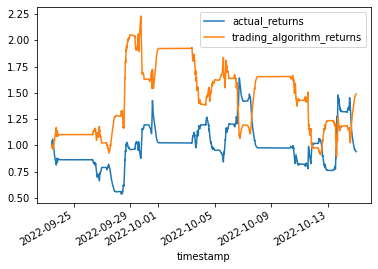

In [38]:
# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot()

In [39]:
signals_df["ATR"].std()

0.23615552265148107